In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

In [2]:
PATCH_SIZE = 512

# Nhãn gốc LoveDA: 1-7 (0 và 255 = ignore)
RAW_LABEL_NAMES = {
    1: "Background",
    2: "Building",
    3: "Road",
    4: "Water",
    5: "Barren",
    6: "Forest",
    7: "Agricultural",
}

# Color map LoveDA official
_BASE_COLORS = np.array([
    [255, 255, 255],  # Background
    [255,   0,   0],  # Building
    [255, 255,   0],  # Road
    [  0,   0, 255],  # Water
    [159, 129, 183],  # Barren
    [  0, 255,   0],  # Forest
    [255, 195, 128],  # Agricultural
], dtype=np.uint8)

RAW_COLOR_MAP = np.zeros((8, 3), dtype=np.uint8)
RAW_COLOR_MAP[0] = [200, 200, 200]   # ignore → xám
for _i in range(1, 8):
    RAW_COLOR_MAP[_i] = _BASE_COLORS[_i - 1]

RAW_TRAIN = "./Train/Train"   # ← chỉnh đường dẫn nếu cần

In [3]:
def crop_dataset(input_root, output_root):
    """Cắt ảnh gốc thành patch 512×512, bỏ patch biên không đủ kích thước."""
    img_out  = os.path.join(output_root, "images")
    mask_out = os.path.join(output_root, "masks")
    os.makedirs(img_out,  exist_ok=True)
    os.makedirs(mask_out, exist_ok=True)

    total = 0
    for area in ["Rural", "Urban"]:
        img_dir  = os.path.join(input_root, area, "images_png")
        mask_dir = os.path.join(input_root, area, "masks_png")
        if not os.path.isdir(img_dir):
            print(f"[WARN] Không tìm thấy: {img_dir}"); continue
        names = sorted(os.listdir(img_dir))
        print(f"[{area}] {len(names)} ảnh...")
        for name in names:
            image = cv2.imread(os.path.join(img_dir,  name))
            mask  = cv2.imread(os.path.join(mask_dir, name), 0)
            if image is None or mask is None: continue
            h, w = image.shape[:2]
            idx  = 0
            for y in range(0, h, PATCH_SIZE):
                for x in range(0, w, PATCH_SIZE):
                    ip = image[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
                    mp = mask [y:y+PATCH_SIZE, x:x+PATCH_SIZE]
                    if ip.shape[0] != PATCH_SIZE or ip.shape[1] != PATCH_SIZE:
                        continue
                    out = name.replace(".png", f"_{idx}.png")
                    cv2.imwrite(os.path.join(img_out,  out), ip)
                    cv2.imwrite(os.path.join(mask_out, out), mp)
                    idx += 1
            total += idx
    print(f"\n✅ Xong! Tổng patch: {total}  →  {os.path.abspath(output_root)}")

In [4]:
def _read_raw_pair(img_path, mask_path):
    img  = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE).astype(np.uint8)
    mask[mask == 255] = 0
    return img, np.clip(mask, 0, 7)

def _count_class_pixels(mask_dir, max_files=None):
    counts = np.zeros(8, dtype=np.int64)
    files  = sorted(os.listdir(mask_dir))
    if max_files: files = files[:max_files]
    for fn in files:
        mask = cv2.imread(os.path.join(mask_dir, fn), cv2.IMREAD_GRAYSCALE).astype(np.uint8)
        mask[mask == 255] = 0
        mask = np.clip(mask, 0, 7)
        for c in range(8):
            counts[c] += (mask == c).sum()
    return counts

In [5]:
def visualize_raw_samples(raw_root, n_per_area=2, patch_size=512, save_path=None):
    """Hiển thị ảnh mẫu Rural & Urban + mask + overlay + lưới patch."""
    samples = []
    for area in ["Rural", "Urban"]:
        img_dir  = os.path.join(raw_root, area, "images_png")
        mask_dir = os.path.join(raw_root, area, "masks_png")
        if not os.path.isdir(img_dir):
            print(f"[WARN] {img_dir}"); continue
        for name in sorted(os.listdir(img_dir))[:n_per_area]:
            img, mask = _read_raw_pair(
                os.path.join(img_dir, name), os.path.join(mask_dir, name))
            samples.append((area, img, mask, name))

    n = len(samples)
    if n == 0: print("Không tìm thấy ảnh."); return

    fig, axes = plt.subplots(n, 4, figsize=(22, 5.5 * n))
    if n == 1: axes = axes[np.newaxis, :]

    titles = [f"Ảnh gốc (lưới patch {patch_size}×{patch_size})",
              "Mask Ground Truth (nhãn 1-7)", "Overlay (α=0.5)", "Phân bố lớp (%)"]
    for c, t in enumerate(titles):
        axes[0, c].set_title(t, fontsize=11, fontweight="bold", pad=8)

    for row, (area, img, mask, name) in enumerate(samples):
        H, W    = img.shape[:2]
        colored = RAW_COLOR_MAP[mask]
        overlay = (img * 0.5 + colored * 0.5).astype(np.uint8)
        tot     = max((mask > 0).sum(), 1)
        ratios  = [(mask == c).sum() / tot * 100 for c in range(1, 8)]

        axes[row, 0].imshow(img)
        for y in range(0, H, patch_size): axes[row, 0].axhline(y, color="yellow", lw=0.8, alpha=0.7)
        for x in range(0, W, patch_size): axes[row, 0].axvline(x, color="yellow", lw=0.8, alpha=0.7)
        axes[row, 0].set_ylabel(f"[{area}]\n{name}\n{W}×{H} px",
                                fontsize=9, rotation=0, labelpad=130, va="center")
        axes[row, 0].axis("off")
        axes[row, 1].imshow(colored);  axes[row, 1].axis("off")
        axes[row, 2].imshow(overlay);  axes[row, 2].axis("off")

        bc   = [RAW_COLOR_MAP[c] / 255.0 for c in range(1, 8)]
        bars = axes[row, 3].barh(range(7), ratios, color=bc, edgecolor="grey", lw=0.5)
        axes[row, 3].set_yticks(range(7))
        axes[row, 3].set_yticklabels(list(RAW_LABEL_NAMES.values()), fontsize=9)
        axes[row, 3].set_xlabel("Tỉ lệ (%)", fontsize=9)
        axes[row, 3].invert_yaxis(); axes[row, 3].grid(axis="x", alpha=0.3)
        for bar, r in zip(bars, ratios):
            if r > 1.5: axes[row, 3].text(bar.get_width()+0.3,
                bar.get_y()+bar.get_height()/2, f"{r:.1f}%", va="center", fontsize=8)

    patches = [mpatches.Patch(color=RAW_COLOR_MAP[c]/255., label=f"{c}: {RAW_LABEL_NAMES[c]}")
               for c in range(1, 8)]
    fig.legend(handles=patches, loc="lower center", ncol=7, fontsize=9,
               framealpha=0.9, bbox_to_anchor=(0.45, -0.02))
    plt.suptitle(f"Dữ liệu LoveDA gốc — TRƯỚC tiền xử lý\n"
                 f"(lưới vàng = vùng crop {patch_size}×{patch_size})",
                 fontsize=14, fontweight="bold", y=1.01)
    plt.tight_layout()
    if save_path:
        os.makedirs(os.path.dirname(os.path.abspath(save_path)), exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Đã lưu → {save_path}")
    plt.show()

In [6]:
def visualize_class_distribution(raw_root, max_files_per_area=None, save_path=None):
    """So sánh phân bố lớp pixel Rural vs Urban (3 panel)."""
    print("Đang đếm pixel theo lớp...")
    counts = {}
    for area in ["Rural", "Urban"]:
        mask_dir = os.path.join(raw_root, area, "masks_png")
        if os.path.isdir(mask_dir):
            counts[area] = _count_class_pixels(mask_dir, max_files_per_area)
            print(f"  {area}: xong ({len(os.listdir(mask_dir))} file)")
        else:
            counts[area] = np.zeros(8, dtype=np.int64)

    labels = list(RAW_LABEL_NAMES.values())
    bc     = [RAW_COLOR_MAP[c] / 255.0 for c in range(1, 8)]
    x      = np.arange(7)

    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    fig.suptitle("Phân bố lớp địa thực vật — Dữ liệu LoveDA gốc\n"
                 "(tính trên tổng pixel, không kể ignore)", fontsize=13, fontweight="bold")

    def _draw(ax, title, cnt):
        tot    = max(cnt[1:].sum(), 1)
        ratios = cnt[1:] / tot * 100
        bars   = ax.bar(x, ratios, color=bc, edgecolor="grey", lw=0.5)
        ax.set_xticks(x); ax.set_xticklabels(labels, rotation=28, ha="right", fontsize=9)
        ax.set_ylabel("Tỉ lệ (%)"); ax.set_title(title, fontsize=12, fontweight="bold")
        ax.set_ylim(0, min(ratios.max() * 1.25 + 1, 100)); ax.grid(axis="y", alpha=0.3)
        for bar, r in zip(bars, ratios):
            if r > 0.5: ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.4,
                                f"{r:.1f}%", ha="center", va="bottom", fontsize=8)

    _draw(axes[0], "Rural",  counts.get("Rural", np.zeros(8)))
    _draw(axes[1], "Urban",  counts.get("Urban", np.zeros(8)))
    combined = sum(counts.values())
    _draw(axes[2], "Rural + Urban (tổng hợp)", combined)

    r_tot = max(counts.get("Rural", np.zeros(8))[1:].sum(), 1)
    u_tot = max(counts.get("Urban", np.zeros(8))[1:].sum(), 1)
    axes[2].plot(x, counts.get("Rural", np.zeros(8))[1:]/r_tot*100,
                 "o--", color="saddlebrown", lw=1.5, ms=5, label="Rural (%)")
    axes[2].plot(x, counts.get("Urban", np.zeros(8))[1:]/u_tot*100,
                 "s--", color="steelblue",   lw=1.5, ms=5, label="Urban (%)")
    axes[2].legend(fontsize=9)
    plt.tight_layout()
    if save_path:
        os.makedirs(os.path.dirname(os.path.abspath(save_path)), exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Đã lưu → {save_path}")
    plt.show()

In [7]:
def visualize_image_sizes(raw_root, save_path=None):
    """Scatter W×H + histogram phân bố kích thước ảnh gốc (Rural vs Urban)."""
    widths, heights, areas_list = [], [], []
    for area in ["Rural", "Urban"]:
        img_dir = os.path.join(raw_root, area, "images_png")
        if not os.path.isdir(img_dir): continue
        for fn in sorted(os.listdir(img_dir)):
            img = cv2.imread(os.path.join(img_dir, fn))
            if img is None: continue
            h, w = img.shape[:2]
            widths.append(w); heights.append(h); areas_list.append(area)

    if not widths: print("Không đọc được ảnh nào."); return
    widths    = np.array(widths)
    heights   = np.array(heights)
    areas_arr = np.array(areas_list)
    clr = {"Rural": "saddlebrown", "Urban": "steelblue"}

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle("Phân bố kích thước ảnh gốc LoveDA — TRƯỚC tiền xử lý",
                 fontsize=13, fontweight="bold")

    for area in ["Rural", "Urban"]:
        m = areas_arr == area
        axes[0].scatter(widths[m], heights[m], c=clr[area], alpha=0.7,
                        s=40, label=area, edgecolors="grey", lw=0.3)
        axes[1].hist(widths[m],  bins=20, alpha=0.6, color=clr[area], edgecolor="grey", lw=0.5, label=area)
        axes[2].hist(heights[m], bins=20, alpha=0.6, color=clr[area], edgecolor="grey", lw=0.5, label=area)

    axes[0].axvline(PATCH_SIZE, color="red", lw=1, ls="--", label=f"{PATCH_SIZE} px")
    axes[0].axhline(PATCH_SIZE, color="red", lw=1, ls="--")
    for ax, xl, t in zip(axes,
        ["Width (px)", "Width (px)", "Height (px)"],
        ["Scatter W vs H", "Histogram Width", "Histogram Height"]):
        ax.set_xlabel(xl); ax.set_ylabel("Số ảnh" if ax != axes[0] else "Height (px)")
        ax.set_title(t, fontsize=11, fontweight="bold")
        ax.legend(fontsize=9); ax.grid(alpha=0.3)

    print(f"Tổng ảnh: {len(widths)}")
    print(f"Width  — min={widths.min()}  max={widths.max()}  unique={np.unique(widths).tolist()}")
    print(f"Height — min={heights.min()}  max={heights.max()}  unique={np.unique(heights).tolist()}")
    plt.tight_layout()
    if save_path:
        os.makedirs(os.path.dirname(os.path.abspath(save_path)), exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Đã lưu → {save_path}")
    plt.show()

## Chạy Visualization — Dữ liệu gốc TRƯỚC tiền xử lý

Đã lưu → ./predictions/raw_samples.png


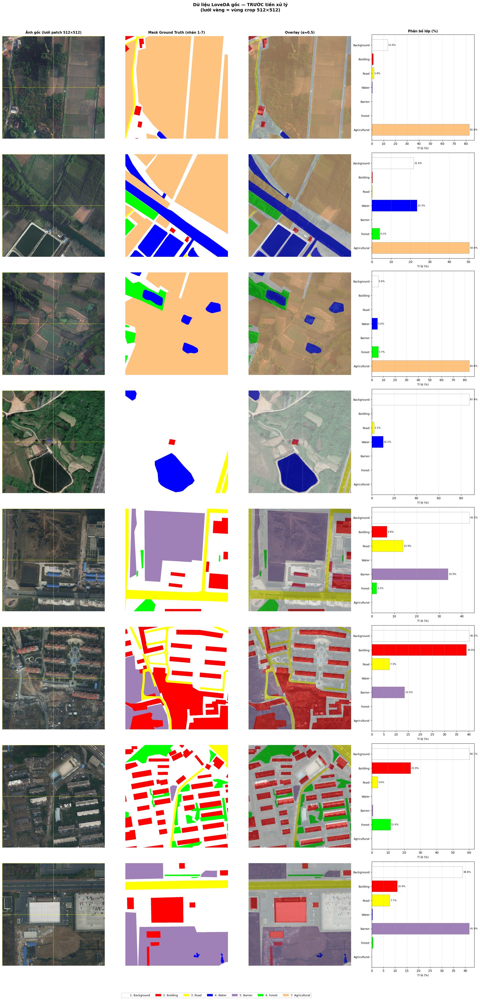

In [8]:
# Ảnh mẫu + lưới patch
visualize_raw_samples(
    RAW_TRAIN,
    n_per_area=4,
    patch_size=PATCH_SIZE,
    save_path="./predictions/raw_samples.png",
)

Đang đếm pixel theo lớp...
  Rural: xong (1366 file)
  Urban: xong (1156 file)
Đã lưu → ./predictions/class_distribution_raw.png


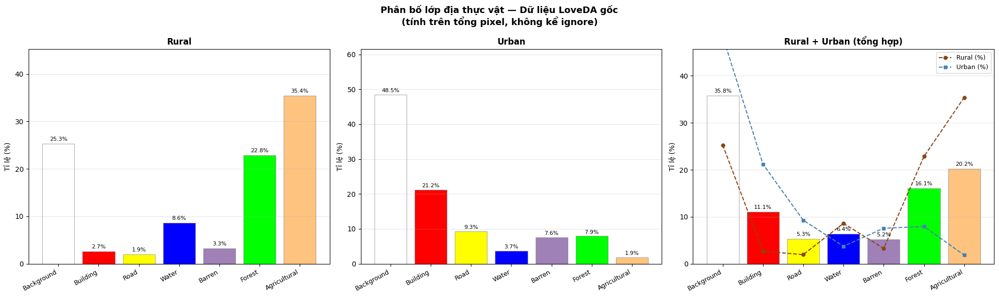

In [9]:
# Phân bố lớp Rural vs Urban
visualize_class_distribution(
    RAW_TRAIN,
    max_files_per_area=None,   # None = đọc hết; truyền số để chạy nhanh hơn
    save_path="./predictions/class_distribution_raw.png",
)

In [10]:
# # Histogram kích thước ảnh gốc
# visualize_image_sizes(
#     RAW_TRAIN,
#     save_path="./predictions/image_sizes.png",
# )

## Crop Dataset (chạy một lần)

In [11]:
# crop_dataset("./Train/Train", "./LoveDA_patch/Train")
# crop_dataset("./Val/Val",     "./LoveDA_patch/Val")